In [1]:
import pandas as pd
import os

In [2]:


# 1. Read the Excel file
df = pd.read_excel("260821-ds-PLA.xlsx", sheet_name=0)

# 2. Save it as a CSV
df.to_csv("260821-ds-PLA.csv", index=False)

# 3. Now you can use standard CSV operations on it
df_csv = pd.read_csv("260821-ds-PLA.csv")

In [ ]:

import pandas as pd

# 1. Load the original CSV file
# Set header=None if your CSV file does not have column names in the top row
df = pd.read_csv("100826-ds-PLA-PB.csv")

# 2. Extract GFP data (Columns 3 to 122 -> indices 2:122; Row 6 onwards -> index 5:)
gfp_data = df.iloc[6:, 2:122]

# 3. Extract mScarlet data (Column 123 onwards -> index 122:; Row 6 onwards -> index 5:)
mscarlet_data = df.iloc[6:, 122:]

# Optional: Convert to numeric types if data was read as strings
# gfp_data = gfp_data.apply(pd.to_numeric, errors='coerce')
# mscarlet_data = mscarlet_data.apply(pd.to_numeric, errors='coerce')

# 4. Save both datasets to separate CSV files
gfp_data.to_csv("data_analysis/100826-ds-PLA-PB-GFP-edited.csv", index=False)
mscarlet_data.to_csv("data_analysis/100826-ds-PLA-PB-mScarlet-edited.csv", index=False)

print(f"GFP dataset extracted: {gfp_data.shape[0]} rows x {gfp_data.shape[1]} columns")
print(f"mScarlet dataset extracted: {mscarlet_data.shape[0]} rows x {mscarlet_data.shape[1]} columns")


FileNotFoundError: [Errno 2] No such file or directory: '260821-ds-PLA-PB.csv'

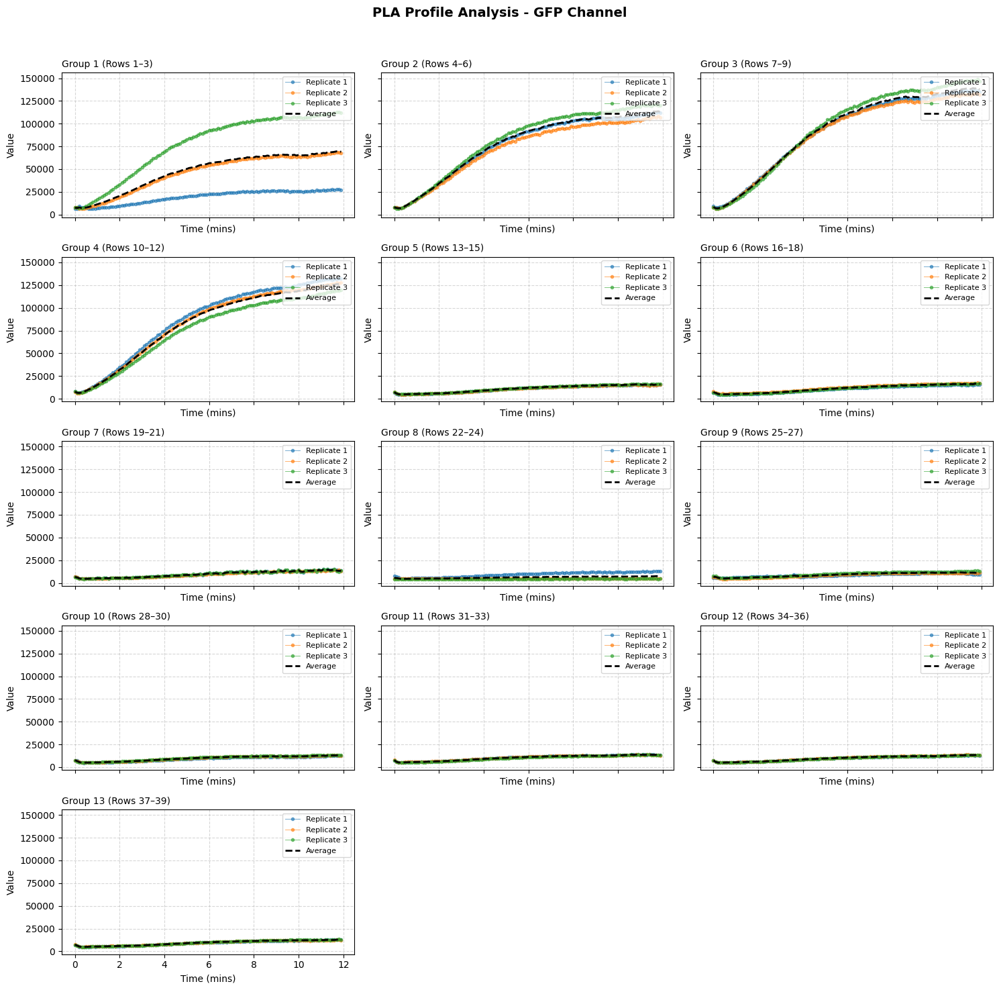

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# 1. Load the edited dataset
edited_df = pd.read_csv("data_analysis/050826-ds-PLA-edited.csv")

# 2. Calculate the X-axis values
num_columns = edited_df.shape[1]
x_values = np.arange(num_columns) / 10  # Time values

# 3. Determine the number of subplots and grid layout (3 columns)
replicates_per_group = 3
num_rows = len(edited_df)
num_subplots = int(np.ceil(num_rows / replicates_per_group))

n_cols = 3
n_rows = int(np.ceil(num_subplots / n_cols))

# Create 3-column grid layout
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 3 * n_rows), sharex=True, sharey=True)

# Flatten axes array for simple 1D indexing
axes_flat = axes.flatten() if isinstance(axes, np.ndarray) else [axes]

# 4. Loop through groups of 3 rows
for subplot_idx in range(num_subplots):
    ax = axes_flat[subplot_idx]
    
    # Extract the 3 replicate rows for this subplot
    start_row = subplot_idx * replicates_per_group
    end_row = min(start_row + replicates_per_group, num_rows)
    group_df = edited_df.iloc[start_row:end_row]
    
    # Plot individual replicate points with small markers
    for idx, (row_label, row_data) in enumerate(group_df.iterrows()):
        ax.plot(
            x_values, 
            row_data.values, 
            marker='o', 
            markersize=3, 
            linewidth=0.7, 
            alpha=0.6, 
            label=f"Replicate {idx + 1}"
        )
    
    # Calculate and plot the average across the 3 replicates
    avg_data = group_df.mean(axis=0)
    ax.plot(
        x_values, 
        avg_data.values, 
        linestyle='--', 
        color='black', 
        linewidth=2, 
        label="Average"
    )
    
    # Formatting
    ax.set_title(f"Group {subplot_idx + 1} (Rows {start_row + 1}–{end_row})", fontsize=10, loc='left')
    ax.grid(True, linestyle="--", alpha=0.5)
    ax.legend(loc="upper right", fontsize=8)

# Set common labels on visible axes
for ax in axes_flat[:num_subplots]:
    ax.set_xlabel("Time (mins)")
    ax.set_ylabel("Value")

# Hide any unused subplots if num_subplots isn't a multiple of 3
for i in range(num_subplots, len(axes_flat)):
    fig.delaxes(axes_flat[i])
# Add a overall main title for the entire figure
fig.suptitle("PLA Profile Analysis - GFP Channel", fontsize=14, fontweight="bold", y=0.98)

# Adjust layout while leaving top space (rect top=0.96) for the suptitle
plt.tight_layout(rect=[0, 0, 1, 0.96])


# Save as SVG if needed
# plt.savefig("data_analysis/030826-ds-PLA-plots.svg", format="svg", bbox_inches="tight")
plt.show()

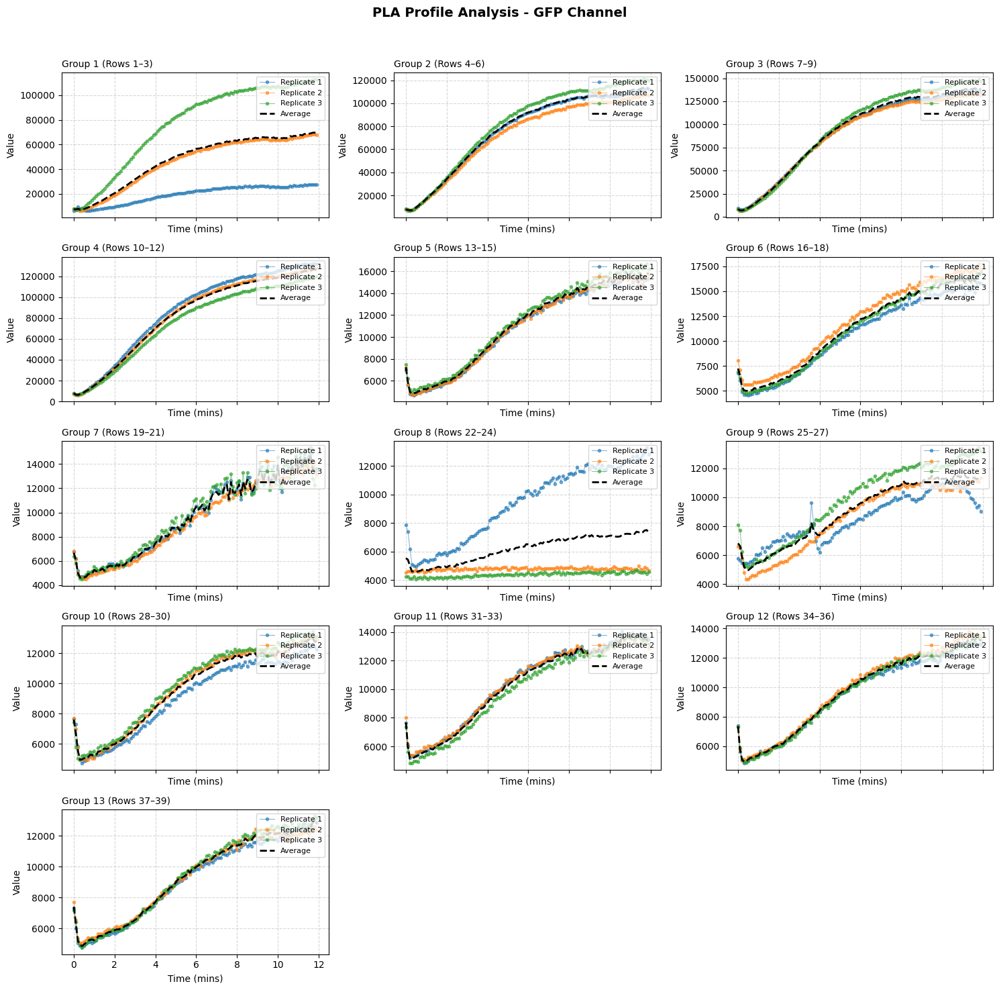

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# 1. Load the edited dataset
edited_df = pd.read_csv("data_analysis/050826-ds-PLA-edited.csv")

# 2. Calculate the X-axis values
num_columns = edited_df.shape[1]
x_values = np.arange(num_columns) / 10  # Time values

# 3. Determine the number of subplots and grid layout (3 columns)
replicates_per_group = 3
num_rows = len(edited_df)
num_subplots = int(np.ceil(num_rows / replicates_per_group))

n_cols = 3
n_rows = int(np.ceil(num_subplots / n_cols))

# Create 3-column grid layout (sharey set to False so each subplot auto-scales independently)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 3 * n_rows), sharex=True, sharey=False)

# Flatten axes array for simple 1D indexing
axes_flat = axes.flatten() if isinstance(axes, np.ndarray) else [axes]

# 4. Loop through groups of 3 rows
for subplot_idx in range(num_subplots):
    ax = axes_flat[subplot_idx]
    
    # Extract the 3 replicate rows for this subplot
    start_row = subplot_idx * replicates_per_group
    end_row = min(start_row + replicates_per_group, num_rows)
    group_df = edited_df.iloc[start_row:end_row]
    
    # Calculate group-specific min and max for y-axis limits
    group_min = group_df.values.min()
    group_max = group_df.values.max()
    padding = (group_max - group_min) * 0.05 if group_max != group_min else 1.0
    
    # Set custom y-limits for this particular group
    ax.set_ylim(group_min - padding, group_max + padding)
    
    # Plot individual replicate points with small markers
    for idx, (row_label, row_data) in enumerate(group_df.iterrows()):
        ax.plot(
            x_values, 
            row_data.values, 
            marker='o', 
            markersize=3, 
            linewidth=0.7, 
            alpha=0.6, 
            label=f"Replicate {idx + 1}"
        )
    
    # Calculate and plot the average across the 3 replicates
    avg_data = group_df.mean(axis=0)
    ax.plot(
        x_values, 
        avg_data.values, 
        linestyle='--', 
        color='black', 
        linewidth=2, 
        label="Average"
    )
    
    # Formatting
    ax.set_title(f"Group {subplot_idx + 1} (Rows {start_row + 1}–{end_row})", fontsize=10, loc='left')
    ax.grid(True, linestyle="--", alpha=0.5)
    ax.legend(loc="upper right", fontsize=8)

# Set common labels on visible axes
for ax in axes_flat[:num_subplots]:
    ax.set_xlabel("Time (mins)")
    ax.set_ylabel("Value")

# Hide any unused subplots if num_subplots isn't a multiple of 3
for i in range(num_subplots, len(axes_flat)):
    fig.delaxes(axes_flat[i])

# Add an overall main title for the entire figure
fig.suptitle("PLA Profile Analysis - GFP Channel", fontsize=14, fontweight="bold", y=0.98)

# Adjust layout while leaving top space (rect top=0.96) for the suptitle
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Save as SVG if needed
#plt.savefig("data_analysis/050826-ds-PLA-plots.svg", format="svg", bbox_inches="tight")
plt.show()

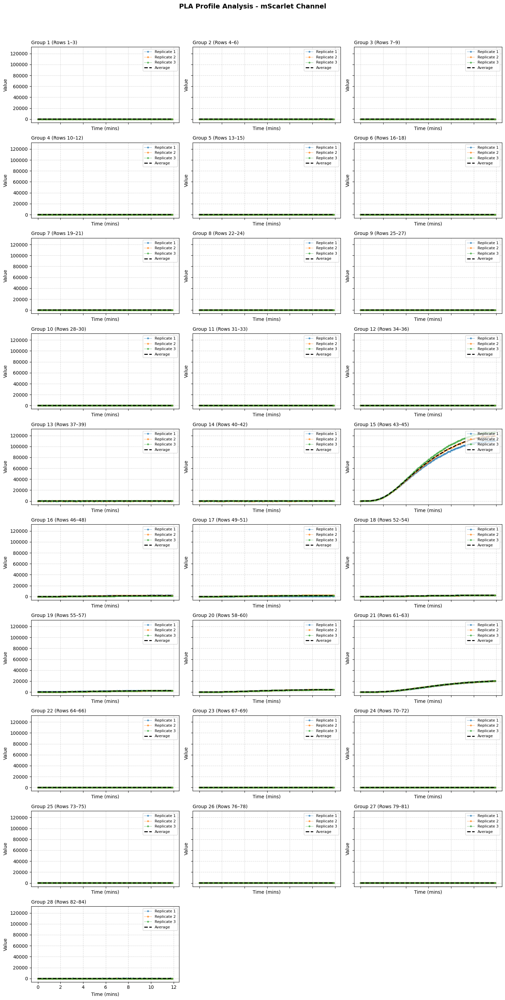

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# 1. Load the edited dataset
edited_df = pd.read_csv("data_analysis/100826-ds-PLA-PB-mScarlet-edited.csv")

# 2. Calculate the X-axis values
num_columns = edited_df.shape[1]
x_values = np.arange(num_columns) / 10  # Time values

# 3. Determine the number of subplots and grid layout (3 columns)
replicates_per_group = 3
num_rows = len(edited_df)
num_subplots = int(np.ceil(num_rows / replicates_per_group))

n_cols = 3
n_rows = int(np.ceil(num_subplots / n_cols))

# Create 3-column grid layout
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 3 * n_rows), sharex=True, sharey=True)

# Flatten axes array for simple 1D indexing
axes_flat = axes.flatten() if isinstance(axes, np.ndarray) else [axes]

# 4. Loop through groups of 3 rows
for subplot_idx in range(num_subplots):
    ax = axes_flat[subplot_idx]
    
    # Extract the 3 replicate rows for this subplot
    start_row = subplot_idx * replicates_per_group
    end_row = min(start_row + replicates_per_group, num_rows)
    group_df = edited_df.iloc[start_row:end_row]
    
    # Plot individual replicate points with small markers
    for idx, (row_label, row_data) in enumerate(group_df.iterrows()):
        ax.plot(
            x_values, 
            row_data.values, 
            marker='o', 
            markersize=3, 
            linewidth=0.7, 
            alpha=0.6, 
            label=f"Replicate {idx + 1}"
        )
    
    # Calculate and plot the average across the 3 replicates
    avg_data = group_df.mean(axis=0)
    ax.plot(
        x_values, 
        avg_data.values, 
        linestyle='--', 
        color='black', 
        linewidth=2, 
        label="Average"
    )
    
    # Formatting
    ax.set_title(f"Group {subplot_idx + 1} (Rows {start_row + 1}–{end_row})", fontsize=10, loc='left')
    ax.grid(True, linestyle="--", alpha=0.5)
    ax.legend(loc="upper right", fontsize=8)

# Set common labels on visible axes
for ax in axes_flat[:num_subplots]:
    ax.set_xlabel("Time (mins)")
    ax.set_ylabel("Value")

# Hide any unused subplots if num_subplots isn't a multiple of 3
for i in range(num_subplots, len(axes_flat)):
    fig.delaxes(axes_flat[i])
# Add a overall main title for the entire figure
fig.suptitle("PLA Profile Analysis - mScarlet Channel", fontsize=14, fontweight="bold", y=0.98)

# Adjust layout while leaving top space (rect top=0.96) for the suptitle
plt.tight_layout(rect=[0, 0, 1, 0.96])


# Save as SVG if needed
# plt.savefig("data_analysis/030826-ds-PLA-plots.svg", format="svg", bbox_inches="tight")
plt.show()

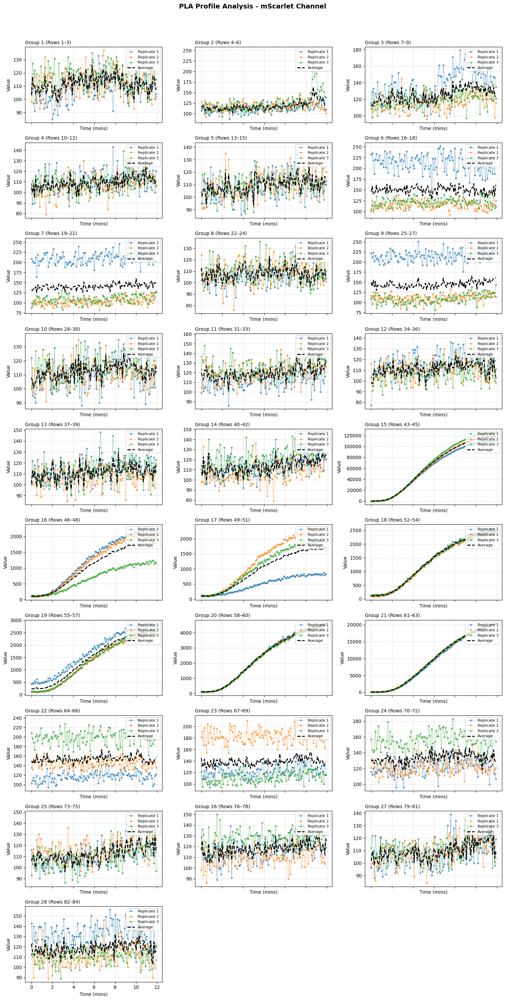

In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# 1. Load the edited dataset
edited_df = pd.read_csv("data_analysis/100826-ds-PLA-PB-mScarlet-edited.csv")

# 2. Calculate the X-axis values
num_columns = edited_df.shape[1]
x_values = np.arange(num_columns) / 10  # Time values

# 3. Determine the number of subplots and grid layout (3 columns)
replicates_per_group = 3
num_rows = len(edited_df)
num_subplots = int(np.ceil(num_rows / replicates_per_group))

n_cols = 3
n_rows = int(np.ceil(num_subplots / n_cols))

# Create 3-column grid layout (sharey set to False so each subplot auto-scales independently)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 3 * n_rows), sharex=True, sharey=False)

# Flatten axes array for simple 1D indexing
axes_flat = axes.flatten() if isinstance(axes, np.ndarray) else [axes]

# 4. Loop through groups of 3 rows
for subplot_idx in range(num_subplots):
    ax = axes_flat[subplot_idx]
    
    # Extract the 3 replicate rows for this subplot
    start_row = subplot_idx * replicates_per_group
    end_row = min(start_row + replicates_per_group, num_rows)
    group_df = edited_df.iloc[start_row:end_row]
    
    # Calculate group-specific min and max for y-axis limits
    group_min = group_df.values.min()
    group_max = group_df.values.max()
    padding = (group_max - group_min) * 0.05 if group_max != group_min else 1.0
    
    # Set custom y-limits for this particular group
    ax.set_ylim(group_min - padding, group_max + padding)
    
    # Plot individual replicate points with small markers
    for idx, (row_label, row_data) in enumerate(group_df.iterrows()):
        ax.plot(
            x_values, 
            row_data.values, 
            marker='o', 
            markersize=3, 
            linewidth=0.7, 
            alpha=0.6, 
            label=f"Replicate {idx + 1}"
        )
    
    # Calculate and plot the average across the 3 replicates
    avg_data = group_df.mean(axis=0)
    ax.plot(
        x_values, 
        avg_data.values, 
        linestyle='--', 
        color='black', 
        linewidth=2, 
        label="Average"
    )
    
    # Formatting
    ax.set_title(f"Group {subplot_idx + 1} (Rows {start_row + 1}–{end_row})", fontsize=10, loc='left')
    ax.grid(True, linestyle="--", alpha=0.5)
    ax.legend(loc="upper right", fontsize=8)

# Set common labels on visible axes
for ax in axes_flat[:num_subplots]:
    ax.set_xlabel("Time (mins)")
    ax.set_ylabel("Value")

# Hide any unused subplots if num_subplots isn't a multiple of 3
for i in range(num_subplots, len(axes_flat)):
    fig.delaxes(axes_flat[i])

# Add an overall main title for the entire figure
fig.suptitle("PLA Profile Analysis - mScarlet Channel", fontsize=14, fontweight="bold", y=0.98)

# Adjust layout while leaving top space (rect top=0.96) for the suptitle
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Save as SVG if needed
# plt.savefig("data_analysis/030826-ds-PLA-plots.svg", format="svg", bbox_inches="tight")
plt.show()

KeyboardInterrupt: 

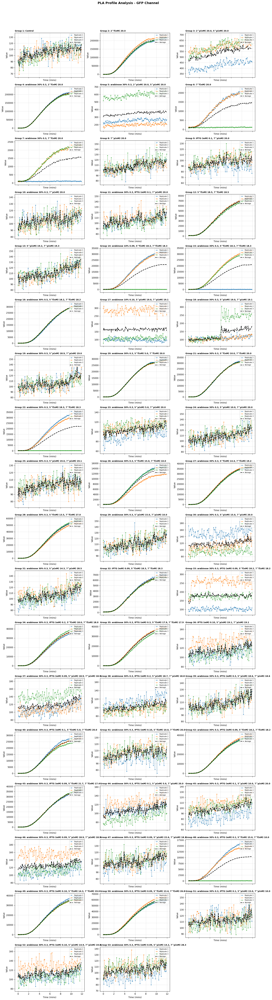

In [ ]:
import io
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

metadata_headers = [
    "arabinose 30%",
    "arabinose 10%",
    "IPTG (mM)",
    "EB",
    "CE",
    "2^f(nM)",
    "5^f(nM)",
    "7^f(nM)",
    "2^p(nM)",
    "5^p(nM)",
    "7^p(nM)",
]

metadata_rows_raw = """0.000000 0.000000 0.000000 0.420000 0.330000 0.0 0.000000 0.000000 0.0 0.000000 0.000000
0.000000 0.000000 0.000000 0.420000 0.330000 20.0 0.000000 0.000000 0.0 0.000000 0.000000
0.000000 0.000000 0.000000 0.420000 0.330000 0.0 0.000000 0.000000 20.0 20.000000 0.000000
0.300000 0.000000 0.000000 0.420000 0.330000 20.0 0.000000 0.000000 0.0 0.000000 0.000000
0.300000 0.000000 0.000000 0.420000 0.330000 0.0 0.000000 0.000000 20.0 20.000000 0.000000
0.000000 0.000000 0.000000 0.420000 0.330000 0.0 0.000000 20.000000 0.0 0.000000 0.000000
0.300000 0.000000 0.000000 0.420000 0.330000 0.0 0.000000 20.000000 0.0 0.000000 0.000000
0.000000 0.000000 0.000000 0.420000 0.330000 0.0 0.000000 0.000000 0.0 0.000000 20.000000
0.000000 0.000000 0.100000 0.420000 0.330000 0.0 0.000000 0.000000 0.0 0.000000 20.000000
0.300000 0.000000 0.000000 0.420000 0.330000 0.0 0.000000 0.000000 0.0 0.000000 20.000000
0.300000 0.000000 0.100000 0.420000 0.330000 0.0 0.000000 0.000000 0.0 0.000000 20.000000
0.000000 0.000000 0.000000 0.387692 0.304615 0.0 18.461538 18.461538 0.0 0.000000 0.000000
0.000000 0.000000 0.000000 0.404494 0.317817 0.0 0.000000 0.000000 0.0 19.226324 19.261637
0.000000 0.091463 0.000000 0.384146 0.301829 0.0 18.292683 18.292683 0.0 0.000000 0.000000
0.274390 0.000000 0.000000 0.384146 0.301829 0.0 18.292683 18.292683 0.0 0.000000 0.000000
0.454545 0.000000 0.000000 0.381818 0.300000 0.0 18.181818 18.181818 0.0 0.000000 0.000000
0.000000 0.095390 0.000000 0.400636 0.314785 0.0 0.000000 0.000000 0.0 19.042925 19.077901
0.286169 0.000000 0.000000 0.400636 0.314785 0.0 0.000000 0.000000 0.0 19.042925 19.077901
0.473934 0.000000 0.000000 0.398104 0.312796 0.0 0.000000 0.000000 0.0 18.922591 18.957346
0.300000 0.000000 0.000000 0.420000 0.330000 0.0 5.000000 20.000000 0.0 0.000000 0.000000
0.300000 0.000000 0.000000 0.420000 0.330000 0.0 10.000000 20.000000 0.0 0.000000 0.000000
0.274390 0.000000 0.000000 0.384146 0.301829 0.0 18.292683 18.292683 0.0 0.000000 0.000000
0.300000 0.000000 0.000000 0.420000 0.330000 0.0 0.000000 0.000000 0.0 5.035000 20.000000
0.300000 0.000000 0.000000 0.420000 0.330000 0.0 0.000000 0.000000 0.0 9.981667 20.000000
0.286169 0.000000 0.000000 0.400636 0.314785 0.0 0.000000 0.000000 0.0 19.042925 19.077901
0.300000 0.000000 0.000000 0.420000 0.330000 0.0 15.000000 10.000000 0.0 0.000000 0.000000
0.287540 0.000000 0.000000 0.402556 0.316294 0.0 14.376997 19.169329 0.0 0.000000 0.000000
0.270270 0.000000 0.000000 0.378378 0.297297 0.0 13.513514 27.027027 0.0 0.000000 0.000000
0.300000 0.000000 0.000000 0.420000 0.330000 0.0 0.000000 0.000000 0.0 15.016667 10.000000
0.299501 0.000000 0.000000 0.419301 0.329451 0.0 0.000000 0.000000 0.0 14.991681 19.966722
0.285261 0.000000 0.000000 0.399366 0.313788 0.0 0.000000 0.000000 0.0 14.278922 28.526149
0.000000 0.000000 0.091603 0.384733 0.302290 0.0 18.320611 18.320611 0.0 0.000000 0.000000
0.272315 0.000000 0.090772 0.381241 0.299546 0.0 18.154312 18.154312 0.0 0.000000 0.000000
0.270270 0.000000 0.180180 0.378378 0.297297 0.0 18.018018 18.018018 0.0 0.000000 0.000000
0.268256 0.000000 0.268256 0.375559 0.295082 0.0 17.883756 17.883756 0.0 0.000000 0.000000
0.000000 0.000000 0.095541 0.401274 0.315287 0.0 0.000000 0.000000 0.0 19.073248 19.108280
0.283912 0.000000 0.094637 0.397476 0.312303 0.0 0.000000 0.000000 0.0 18.892744 18.927445
0.281690 0.000000 0.187793 0.394366 0.309859 0.0 0.000000 0.000000 0.0 18.744914 18.779343
0.279503 0.000000 0.279503 0.391304 0.307453 0.0 0.000000 0.000000 0.0 18.599379 18.633540
0.300000 0.000000 0.100000 0.420000 0.330000 0.0 5.000000 20.000000 0.0 0.000000 0.000000
0.299501 0.000000 0.099834 0.419301 0.329451 0.0 9.983361 19.966722 0.0 0.000000 0.000000
0.272315 0.000000 0.090772 0.381241 0.299546 0.0 18.154312 18.154312 0.0 0.000000 0.000000
0.260492 0.000000 0.086831 0.364689 0.286541 0.0 21.707670 17.366136 0.0 0.000000 0.000000
0.300000 0.000000 0.100000 0.420000 0.330000 0.0 0.000000 0.000000 0.0 5.035000 20.000000
0.300000 0.000000 0.100000 0.420000 0.330000 0.0 0.000000 0.000000 0.0 9.981667 20.000000
0.283912 0.000000 0.094637 0.397476 0.312303 0.0 0.000000 0.000000 0.0 18.892744 18.927445
0.271739 0.000000 0.090580 0.380435 0.298913 0.0 0.000000 0.000000 0.0 22.643418 18.115942
0.300000 0.000000 0.100000 0.420000 0.330000 0.0 15.000000 10.000000 0.0 0.000000 0.000000
0.285261 0.000000 0.095087 0.399366 0.313788 0.0 14.263074 19.017433 0.0 0.000000 0.000000
0.268256 0.000000 0.089419 0.375559 0.295082 0.0 13.412817 26.825633 0.0 0.000000 0.000000
0.300000 0.000000 0.100000 0.420000 0.330000 0.0 0.000000 0.000000 0.0 15.016667 10.000000
0.297030 0.000000 0.099010 0.415842 0.326733 0.0 0.000000 0.000000 0.0 14.867987 19.801980
0.283019 0.000000 0.094340 0.396226 0.311321 0.0 0.000000 0.000000 0.0 14.166667 28.301887"""

meta_df = pd.read_csv(io.StringIO(metadata_rows_raw), sep=r'\s+', header=None, names=metadata_headers)

edited_df = pd.read_csv("data_analysis/140826-ds-PLA-edited.csv")

# 2. Grid setup
num_columns = edited_df.shape[1]
x_values = np.arange(num_columns) / 10

replicates_per_group = 3
num_rows = len(edited_df)
num_subplots = int(np.ceil(num_rows / replicates_per_group))

n_cols = 3
n_rows = int(np.ceil(num_subplots / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 3.5 * n_rows), sharex=True, sharey=False)
axes_flat = axes.flatten() if isinstance(axes, np.ndarray) else [axes]

# 3. Heading function (takes single condition row corresponding to the subplot index)
def get_group_title(meta_df, mix_idx):
    # Take metadata corresponding to Mix no. (mix_idx)
    row = meta_df.iloc[mix_idx]
    
    cols = [c for c in meta_df.columns if c not in ['EB', 'CE']]
    parts = []
    
    for col in cols:
        val = pd.to_numeric(row[col], errors='coerce')
        if pd.notna(val) and val > 0:
            formatted_val = f"{val:.1f}" if val >= 0.1 else f"{val:.2f}"
            parts.append(f"{col} {formatted_val}")
            
    return ", ".join(parts) if parts else "Control"

# 4. Plotting
for subplot_idx in range(num_subplots):
    ax = axes_flat[subplot_idx]
    
    start_row = subplot_idx * replicates_per_group
    end_row = min(start_row + replicates_per_group, num_rows)
    group_df = edited_df.iloc[start_row:end_row]
    
    group_min = group_df.values.min()
    group_max = group_df.values.max()
    padding = (group_max - group_min) * 0.08 if group_max != group_min else 1.0
    ax.set_ylim(group_min - padding, group_max + padding)
    
    for idx, (row_label, row_data) in enumerate(group_df.iterrows()):
        ax.plot(
            x_values, 
            row_data.values, 
            marker='o', 
            markersize=3, 
            linewidth=0.7, 
            alpha=0.6, 
            label=f"Replicate {idx + 1}"
        )
    
    avg_data = group_df.mean(axis=0)
    ax.plot(
        x_values, 
        avg_data.values, 
        linestyle='--', 
        color='black', 
        linewidth=2, 
        label="Average"
    )
    
    # Pass subplot_idx so Group 1 gets Mix 1 metadata
    title_text = get_group_title(meta_df, subplot_idx)
    ax.set_title(f"Group {subplot_idx + 1}: {title_text}", fontsize=9, loc='left', fontweight='semibold')
    ax.grid(True, linestyle="--", alpha=0.5)
    ax.legend(loc="upper right", fontsize=7)

for ax in axes_flat[:num_subplots]:
    ax.set_xlabel("Time (mins)")
    ax.set_ylabel("Value")

for i in range(num_subplots, len(axes_flat)):
    fig.delaxes(axes_flat[i])

fig.suptitle("PLA Profile Analysis - GFP Channel", fontsize=14, fontweight="bold", y=0.98)
plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.savefig("echo-100826/100826-ds-PLA-PB-GFP.svg", format="svg", bbox_inches="tight")
plt.show()

In [ ]:
arabinose 30%	arabinose 10%	IPTG (mM)	EB	CE	2^f(nM)	5^f(nM)	7^f(nM)	2^p(nM)	5^p(nM)	7^p(nM)
Mix no1	0.000000	0.000000	0.000000	0.420000	0.330000	0.0	0.000000	0.000000	0.00	0.000000	0.000000
Mix no2	0.000000	0.000000	0.000000	0.420000	0.330000	20.0	0.000000	0.000000	0.00	0.000000	0.000000
Mix no3	0.000000	0.000000	0.000000	0.420000	0.330000	0.0	0.000000	0.000000	20.02	0.000000	0.000000
Mix no4	0.300000	0.000000	0.000000	0.420000	0.330000	20.0	0.000000	0.000000	0.00	0.000000	0.000000
Mix no5	0.300000	0.000000	0.000000	0.420000	0.330000	0.0	0.000000	0.000000	20.02	0.000000	0.000000
Mix no6	0.000000	0.000000	0.000000	0.420000	0.330000	0.0	0.000000	20.000000	0.00	0.000000	0.000000
Mix no7	0.300000	0.000000	0.000000	0.420000	0.330000	0.0	0.000000	20.000000	0.00	0.000000	0.000000
Mix no8	0.000000	0.000000	0.000000	0.420000	0.330000	0.0	0.000000	0.000000	0.00	0.000000	20.000000
Mix no9	0.000000	0.000000	0.100000	0.420000	0.330000	0.0	0.000000	0.000000	0.00	0.000000	20.000000
Mix no10	0.300000	0.000000	0.000000	0.420000	0.330000	0.0	0.000000	0.000000	0.00	0.000000	20.000000
Mix no11	0.300000	0.000000	0.100000	0.420000	0.330000	0.0	0.000000	0.000000	0.00	0.000000	20.000000
Mix no12	0.000000	0.000000	0.000000	0.387692	0.304615	0.0	18.461538	18.461538	0.00	0.000000	0.000000
Mix no13	0.000000	0.000000	0.000000	0.404494	0.317817	0.0	0.000000	0.000000	0.00	19.226324	19.261637
Mix no14	0.000000	0.091463	0.000000	0.384146	0.301829	0.0	18.292683	18.292683	0.00	0.000000	0.000000
Mix no15	0.274390	0.000000	0.000000	0.384146	0.301829	0.0	18.292683	18.292683	0.00	0.000000	0.000000
Mix no16	0.454545	0.000000	0.000000	0.381818	0.300000	0.0	18.181818	18.181818	0.00	0.000000	0.000000
Mix no17	0.000000	0.095390	0.000000	0.400636	0.314785	0.0	0.000000	0.000000	0.00	19.042925	19.077901
Mix no18	0.286169	0.000000	0.000000	0.400636	0.314785	0.0	0.000000	0.000000	0.00	19.042925	19.077901
Mix no19	0.473934	0.000000	0.000000	0.398104	0.312796	0.0	0.000000	0.000000	0.00	18.922591	18.957346
Mix no20	0.300000	0.000000	0.000000	0.420000	0.330000	0.0	5.000000	20.000000	0.00	0.000000	0.000000
Mix no21	0.300000	0.000000	0.000000	0.420000	0.330000	0.0	10.000000	20.000000	0.00	0.000000	0.000000
Mix no22	0.274390	0.000000	0.000000	0.384146	0.301829	0.0	18.292683	18.292683	0.00	0.000000	0.000000
Mix no23	0.300000	0.000000	0.000000	0.420000	0.330000	0.0	0.000000	0.000000	0.00	5.035000	20.000000
Mix no24	0.300000	0.000000	0.000000	0.420000	0.330000	0.0	0.000000	0.000000	0.00	9.981667	20.000000
Mix no25	0.286169	0.000000	0.000000	0.400636	0.314785	0.0	0.000000	0.000000	0.00	19.042925	19.077901
Mix no26	0.300000	0.000000	0.000000	0.420000	0.330000	0.0	15.000000	10.000000	0.00	0.000000	0.000000
Mix no27	0.287540	0.000000	0.000000	0.402556	0.316294	0.0	14.376997	19.169329	0.00	0.000000	0.000000
Mix no28	0.270270	0.000000	0.000000	0.378378	0.297297	0.0	13.513514	27.027027	0.00	0.000000	0.000000
Mix no29	0.300000	0.000000	0.000000	0.420000	0.330000	0.0	0.000000	0.000000	0.00	15.016667	10.000000
Mix no30	0.299501	0.000000	0.000000	0.419301	0.329451	0.0	0.000000	0.000000	0.00	14.991681	19.966722
Mix no31	0.285261	0.000000	0.000000	0.399366	0.313788	0.0	0.000000	0.000000	0.00	14.278922	28.526149
Mix no32	0.000000	0.000000	0.091603	0.384733	0.302290	0.0	18.320611	18.320611	0.00	0.000000	0.000000
Mix no33	0.272315	0.000000	0.090772	0.381241	0.299546	0.0	18.154312	18.154312	0.00	0.000000	0.000000
Mix no34	0.270270	0.000000	0.180180	0.378378	0.297297	0.0	18.018018	18.018018	0.00	0.000000	0.000000
Mix no35	0.268256	0.000000	0.268256	0.375559	0.295082	0.0	17.883756	17.883756	0.00	0.000000	0.000000
Mix no36	0.000000	0.000000	0.095541	0.401274	0.315287	0.0	0.000000	0.000000	0.00	19.073248	19.108280
Mix no37	0.283912	0.000000	0.094637	0.397476	0.312303	0.0	0.000000	0.000000	0.00	18.892744	18.927445
Mix no38	0.281690	0.000000	0.187793	0.394366	0.309859	0.0	0.000000	0.000000	0.00	18.744914	18.779343
Mix no39	0.279503	0.000000	0.279503	0.391304	0.307453	0.0	0.000000	0.000000	0.00	18.599379	18.633540
Mix no40	0.300000	0.000000	0.100000	0.420000	0.330000	0.0	5.000000	20.000000	0.00	0.000000	0.000000
Mix no41	0.299501	0.000000	0.099834	0.419301	0.329451	0.0	9.983361	19.966722	0.00	0.000000	0.000000
Mix no42	0.272315	0.000000	0.090772	0.381241	0.299546	0.0	18.154312	18.154312	0.00	0.000000	0.000000
Mix no43	0.260492	0.000000	0.086831	0.364689	0.286541	0.0	21.707670	17.366136	0.00	0.000000	0.000000
Mix no44	0.300000	0.000000	0.100000	0.420000	0.330000	0.0	0.000000	0.000000	0.00	5.035000	20.000000
Mix no45	0.300000	0.000000	0.100000	0.420000	0.330000	0.0	0.000000	0.000000	0.00	9.981667	20.000000
Mix no46	0.283912	0.000000	0.094637	0.397476	0.312303	0.0	0.000000	0.000000	0.00	18.892744	18.927445
Mix no47	0.271739	0.000000	0.090580	0.380435	0.298913	0.0	0.000000	0.000000	0.00	22.643418	18.115942
Mix no48	0.300000	0.000000	0.100000	0.420000	0.330000	0.0	15.000000	10.000000	0.00	0.000000	0.000000
Mix no49	0.285261	0.000000	0.095087	0.399366	0.313788	0.0	14.263074	19.017433	0.00	0.000000	0.000000
Mix no50	0.268256	0.000000	0.089419	0.375559	0.295082	0.0	13.412817	26.825633	0.00	0.000000	0.000000
Mix no51	0.300000	0.000000	0.100000	0.420000	0.330000	0.0	0.000000	0.000000	0.00	15.016667	10.000000
Mix no52	0.297030	0.000000	0.099010	0.415842	0.326733	0.0	0.000000	0.000000	0.00	14.867987	19.801980
Mix no53	0.283019	0.000000	0.094340	0.396226	0.311321	0.0	0.000000	0.000000	0.00	14.166667	28.301887


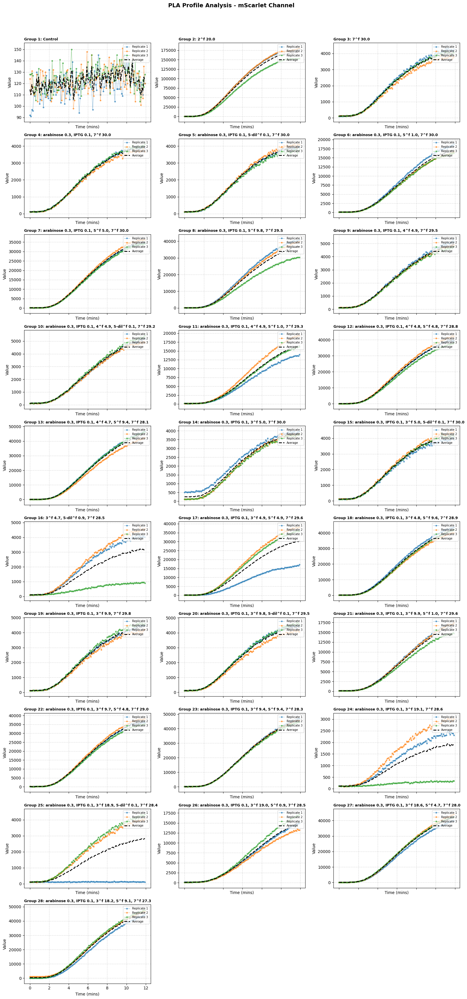

In [15]:
import io
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

metadata_headers = [
    "arabinose",
    "IPTG",
    "EB",
    "CE",
    "2^f",
    "3^f",
    "4^f",
    "5-dil^f",
    "5^f",
    "7^f",
]

metadata_rows_raw = """0.0 0.0 0.4 0.3 0.0 0.0 0.0 0.0 0.0 0.0
0.0 0.0 0.4 0.3 20.0 0.0 0.0 0.0 0.0 0.0
0.0 0.0 0.4 0.3 0.0 0.0 0.0 0.0 0.0 30.0
0.3 0.1 0.4 0.3 0.0 0.0 0.0 0.0 0.0 30.0
0.3 0.1 0.4 0.3 0.0 0.0 0.0 0.1 0.0 30.0
0.3 0.1 0.4 0.3 0.0 0.0 0.0 0.0 1.0 30.0
0.3 0.1 0.4 0.3 0.0 0.0 0.0 0.0 5.0 30.0
0.3 0.1 0.4 0.3 0.0 0.0 0.0 0.0 9.8 29.5
0.3 0.1 0.4 0.3 0.0 0.0 4.9 0.0 0.0 29.5
0.3 0.1 0.4 0.3 0.0 0.0 4.9 0.1 0.0 29.2
0.3 0.1 0.4 0.3 0.0 0.0 4.9 0.0 1.0 29.3
0.3 0.1 0.4 0.3 0.0 0.0 4.8 0.0 4.8 28.8
0.3 0.1 0.4 0.3 0.0 0.0 4.7 0.0 9.4 28.1
0.3 0.1 0.4 0.3 0.0 5.0 0.0 0.0 0.0 30.0
0.3 0.1 0.4 0.3 0.0 5.0 0.0 0.1 0.0 30.0
0.0 0.0 0.4 0.3 0.0 4.7 0.0 0.9 0.0 28.5
0.3 0.1 0.4 0.3 0.0 4.9 0.0 0.0 4.9 29.6
0.3 0.1 0.4 0.3 0.0 4.8 0.0 0.0 9.6 28.9
0.3 0.1 0.4 0.3 0.0 9.9 0.0 0.0 0.0 29.8
0.3 0.1 0.4 0.3 0.0 9.8 0.0 0.1 0.0 29.5
0.3 0.1 0.4 0.3 0.0 9.9 0.0 0.0 1.0 29.6
0.3 0.1 0.4 0.3 0.0 9.7 0.0 0.0 4.8 29.0
0.3 0.1 0.4 0.3 0.0 9.4 0.0 0.0 9.4 28.3
0.3 0.1 0.4 0.3 0.0 19.1 0.0 0.0 0.0 28.6
0.3 0.1 0.4 0.3 0.0 18.9 0.0 0.1 0.0 28.4
0.3 0.1 0.4 0.3 0.0 19.0 0.0 0.0 0.9 28.5
0.3 0.1 0.4 0.3 0.0 18.6 0.0 0.0 4.7 28.0
0.3 0.1 0.4 0.3 0.0 18.2 0.0 0.0 9.1 27.3"""

meta_df = pd.read_csv(io.StringIO(metadata_rows_raw), sep=r'\s+', header=None, names=metadata_headers)

edited_df = pd.read_csv("data_analysis/260818-ds-PLA-edited.csv")
# 2. Grid setup
num_columns = edited_df.shape[1]
x_values = np.arange(num_columns) / 10

replicates_per_group = 3
num_rows = len(edited_df)
num_subplots = int(np.ceil(num_rows / replicates_per_group))

n_cols = 3
n_rows = int(np.ceil(num_subplots / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 3.5 * n_rows), sharex=True, sharey=False)
axes_flat = axes.flatten() if isinstance(axes, np.ndarray) else [axes]

# 3. Heading function (takes single condition row corresponding to the subplot index)
def get_group_title(meta_df, mix_idx):
    # Take metadata corresponding to Mix no. (mix_idx)
    row = meta_df.iloc[mix_idx]
    
    cols = [c for c in meta_df.columns if c not in ['EB', 'CE']]
    parts = []
    
    for col in cols:
        val = pd.to_numeric(row[col], errors='coerce')
        if pd.notna(val) and val > 0:
            formatted_val = f"{val:.1f}" if val >= 0.1 else f"{val:.2f}"
            parts.append(f"{col} {formatted_val}")
            
    return ", ".join(parts) if parts else "Control"

# 4. Plotting
for subplot_idx in range(num_subplots):
    ax = axes_flat[subplot_idx]
    
    start_row = subplot_idx * replicates_per_group
    end_row = min(start_row + replicates_per_group, num_rows)
    group_df = edited_df.iloc[start_row:end_row]
    
    group_min = group_df.values.min()
    group_max = group_df.values.max()
    padding = (group_max - group_min) * 0.08 if group_max != group_min else 1.0
    ax.set_ylim(group_min - padding, group_max + padding)
    
    for idx, (row_label, row_data) in enumerate(group_df.iterrows()):
        ax.plot(
            x_values, 
            row_data.values, 
            marker='o', 
            markersize=3, 
            linewidth=0.7, 
            alpha=0.6, 
            label=f"Replicate {idx + 1}"
        )
    
    avg_data = group_df.mean(axis=0)
    ax.plot(
        x_values, 
        avg_data.values, 
        linestyle='--', 
        color='black', 
        linewidth=2, 
        label="Average"
    )
    
    # Pass subplot_idx so Group 1 gets Mix 1 metadata
    title_text = get_group_title(meta_df, subplot_idx)
    ax.set_title(f"Group {subplot_idx + 1}: {title_text}", fontsize=9, loc='left', fontweight='semibold')
    ax.grid(True, linestyle="--", alpha=0.5)
    ax.legend(loc="upper right", fontsize=7)

for ax in axes_flat[:num_subplots]:
    ax.set_xlabel("Time (mins)")
    ax.set_ylabel("Value")

for i in range(num_subplots, len(axes_flat)):
    fig.delaxes(axes_flat[i])

fig.suptitle("PLA Profile Analysis - mScarlet Channel", fontsize=14, fontweight="bold", y=0.98)
plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.savefig("echo-260818/260818-ds-PLA-mScarlet.svg", format="svg", bbox_inches="tight")
plt.show()

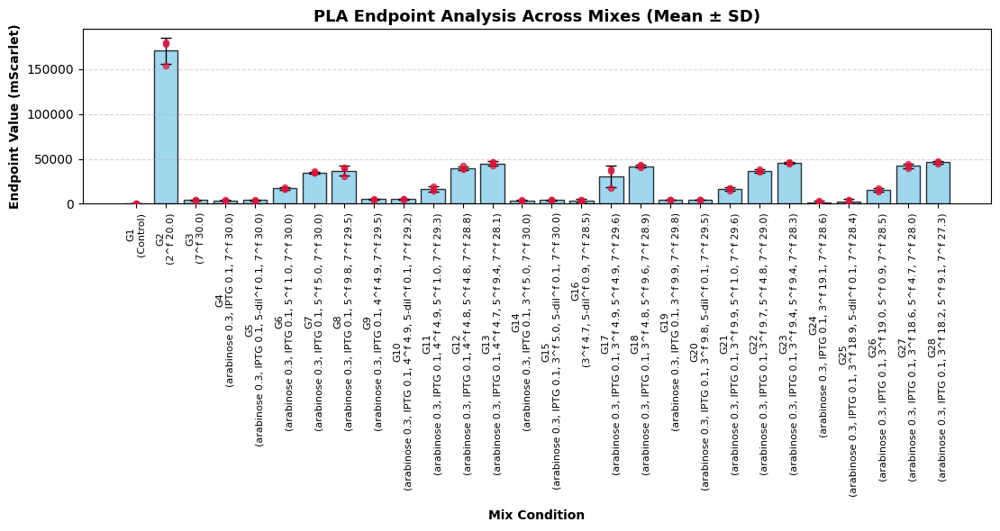

In [16]:
#Do a bar plot where you compare the last time points for each sample

import io
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# 1. Load metadata & data
meta_df = pd.read_csv(io.StringIO(metadata_rows_raw), sep=r'\s+', header=None, names=metadata_headers)
edited_df = pd.read_csv("data_analysis/260818-ds-PLA-edited.csv")

replicates_per_group = 3
num_rows = len(edited_df)
num_groups = int(np.ceil(num_rows / replicates_per_group))

# 2. Extract endpoints (the last column) and build labels/data
group_labels = []
means = []
stds = []

# Re-use your helper function for clean x-axis labels
def get_group_title(meta_df, mix_idx):
    row = meta_df.iloc[mix_idx]
    cols = [c for c in meta_df.columns if c not in ['EB', 'CE']]
    parts = []
    for col in cols:
        val = pd.to_numeric(row[col], errors='coerce')
        if pd.notna(val) and val > 0:
            formatted_val = f"{val:.1f}" if val >= 0.1 else f"{val:.2f}"
            parts.append(f"{col} {formatted_val}")
    return ", ".join(parts) if parts else "Control"

for group_idx in range(num_groups):
    start_row = group_idx * replicates_per_group
    end_row = min(start_row + replicates_per_group, num_rows)
    
    # Get triplicates for the group
    group_df = edited_df.iloc[start_row:end_row]
    
    # Extract endpoint (last column) for all 3 replicates
    endpoints = group_df.iloc[:, -1]
    
    means.append(endpoints.mean())
    stds.append(endpoints.std())
    
    # Construct label using group index and condition
    condition = get_group_title(meta_df, group_idx)
    group_labels.append(f"G{group_idx + 1}\n({condition})")

# 3. Create Bar Plot
plt.figure(figsize=(max(10, num_groups * 0.4), 6))

x_pos = np.arange(num_groups)
bars = plt.bar(
    x_pos, 
    means, 
    yerr=stds, 
    capsize=4, 
    color='skyblue', 
    edgecolor='black', 
    alpha=0.8,
    error_kw={'ecolor': 'black', 'linewidth': 1}
)

# 4. Optional: Overlay individual triplicate dots for transparency
for group_idx in range(num_groups):
    start_row = group_idx * replicates_per_group
    end_row = min(start_row + replicates_per_group, num_rows)
    endpoints = edited_df.iloc[start_row:end_row, -1]
    
    # Scatter plot individual replicate points
    plt.scatter([group_idx] * len(endpoints), endpoints, color='crimson', zorder=3, alpha=0.7, s=20)

plt.xlabel("Mix Condition", fontweight="bold", labelpad=10)
plt.ylabel("Endpoint Value (mScarlet)", fontweight="bold")
plt.title("PLA Endpoint Analysis Across Mixes (Mean ± SD)", fontsize=13, fontweight="bold")

plt.xticks(x_pos, group_labels, rotation=90, fontsize=8)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()

plt.savefig("echo-260818/260818-ds-PLA-endpoints.svg", format="svg", bbox_inches="tight")
plt.show()

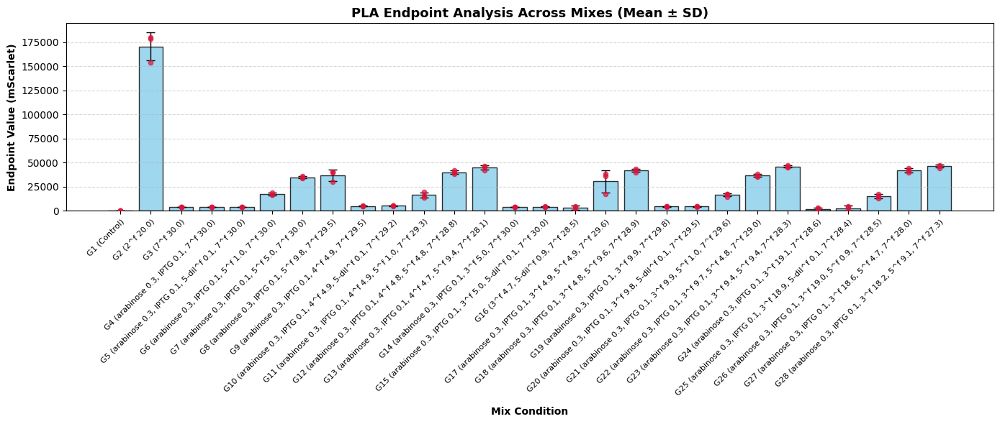

In [17]:
import io
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# 1. Load metadata & data
meta_df = pd.read_csv(io.StringIO(metadata_rows_raw), sep=r'\s+', header=None, names=metadata_headers)
edited_df = pd.read_csv("data_analysis/260818-ds-PLA-edited.csv")

replicates_per_group = 3
num_rows = len(edited_df)
num_groups = int(np.ceil(num_rows / replicates_per_group))

# 2. Extract endpoints and build labels/data
group_labels = []
means = []
stds = []

def get_group_title(meta_df, mix_idx):
    row = meta_df.iloc[mix_idx]
    cols = [c for c in meta_df.columns if c not in ['EB', 'CE']]
    parts = []
    for col in cols:
        val = pd.to_numeric(row[col], errors='coerce')
        if pd.notna(val) and val > 0:
            formatted_val = f"{val:.1f}" if val >= 0.1 else f"{val:.2f}"
            parts.append(f"{col} {formatted_val}")
    return ", ".join(parts) if parts else "Control"

for group_idx in range(num_groups):
    start_row = group_idx * replicates_per_group
    end_row = min(start_row + replicates_per_group, num_rows)
    
    group_df = edited_df.iloc[start_row:end_row]
    endpoints = group_df.iloc[:, -1]
    
    means.append(endpoints.mean())
    stds.append(endpoints.std())
    
    condition = get_group_title(meta_df, group_idx)
    group_labels.append(f"G{group_idx + 1} ({condition})")

# 3. Create Bar Plot
plt.figure(figsize=(max(12, num_groups * 0.5), 6))

x_pos = np.arange(num_groups)
bars = plt.bar(
    x_pos, 
    means, 
    yerr=stds, 
    capsize=4, 
    color='skyblue', 
    edgecolor='black', 
    alpha=0.8,
    error_kw={'ecolor': 'black', 'linewidth': 1}
)

# Overlay triplicate dots
for group_idx in range(num_groups):
    start_row = group_idx * replicates_per_group
    end_row = min(start_row + replicates_per_group, num_rows)
    endpoints = edited_df.iloc[start_row:end_row, -1]
    plt.scatter([group_idx] * len(endpoints), endpoints, color='crimson', zorder=3, alpha=0.7, s=20)

plt.xlabel("Mix Condition", fontweight="bold", labelpad=10)
plt.ylabel("Endpoint Value (mScarlet)", fontweight="bold")
plt.title("PLA Endpoint Analysis Across Mixes (Mean ± SD)", fontsize=13, fontweight="bold")

# 4. Tilted X-Labels with right alignment
plt.xticks(
    x_pos, 
    group_labels, 
    rotation=45,       # Tilt angle
    ha='right',        # Align right edge of text with the tick
    rotation_mode='anchor',
    fontsize=8
)

plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()

plt.savefig("echo-260818/260818-ds-PLA-endpoints.svg", format="svg", bbox_inches="tight")
plt.show()

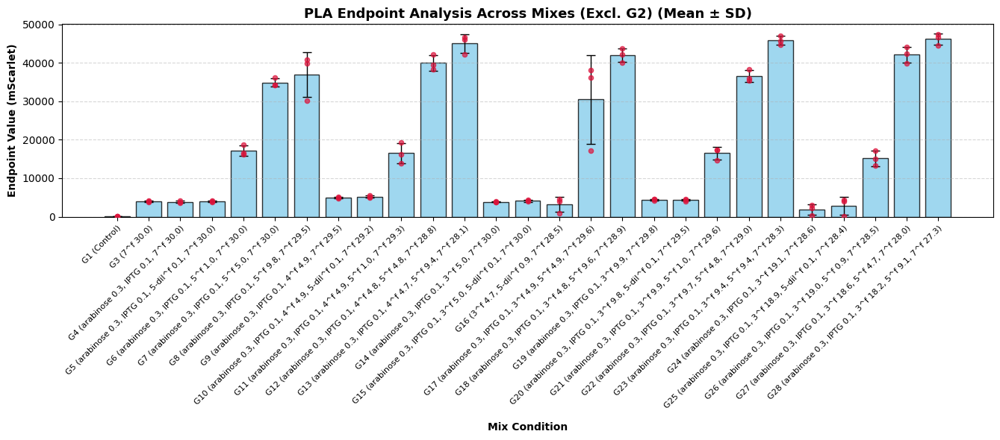

In [19]:
import io
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# 1. Load metadata & data
meta_df = pd.read_csv(io.StringIO(metadata_rows_raw), sep=r'\s+', header=None, names=metadata_headers)
edited_df = pd.read_csv("data_analysis/260818-ds-PLA-edited.csv")

replicates_per_group = 3
num_rows = len(edited_df)
num_groups = int(np.ceil(num_rows / replicates_per_group))

# 2. Extract endpoints and build labels/data
group_labels = []
means = []
stds = []
filtered_group_indices = []  # Track original group indices to plot correct points

def get_group_title(meta_df, mix_idx):
    row = meta_df.iloc[mix_idx]
    cols = [c for c in meta_df.columns if c not in ['EB', 'CE']]
    parts = []
    for col in cols:
        val = pd.to_numeric(row[col], errors='coerce')
        if pd.notna(val) and val > 0:
            formatted_val = f"{val:.1f}" if val >= 0.1 else f"{val:.2f}"
            parts.append(f"{col} {formatted_val}")
    return ", ".join(parts) if parts else "Control"

for group_idx in range(num_groups):
    # Exclude Group 2 specifically (0-indexed position 1)
    if group_idx == 1:
        continue

    start_row = group_idx * replicates_per_group
    end_row = min(start_row + replicates_per_group, num_rows)
    
    group_df = edited_df.iloc[start_row:end_row]
    endpoints = group_df.iloc[:, -1]
    
    means.append(endpoints.mean())
    stds.append(endpoints.std())
    
    condition = get_group_title(meta_df, group_idx)
    group_labels.append(f"G{group_idx + 1} ({condition})")
    filtered_group_indices.append(group_idx)

# 3. Create Bar Plot
plt.figure(figsize=(max(12, len(means) * 0.5), 6))

x_pos = np.arange(len(means))
bars = plt.bar(
    x_pos, 
    means, 
    yerr=stds, 
    capsize=4, 
    color='skyblue', 
    edgecolor='black', 
    alpha=0.8,
    error_kw={'ecolor': 'black', 'linewidth': 1}
)

# Overlay triplicate dots for remaining groups
for i, orig_group_idx in enumerate(filtered_group_indices):
    start_row = orig_group_idx * replicates_per_group
    end_row = min(start_row + replicates_per_group, num_rows)
    endpoints = edited_df.iloc[start_row:end_row, -1]
    plt.scatter([i] * len(endpoints), endpoints, color='crimson', zorder=3, alpha=0.7, s=20)

plt.xlabel("Mix Condition", fontweight="bold", labelpad=12)
plt.ylabel("Endpoint Value (mScarlet)", fontweight="bold")
plt.title("PLA Endpoint Analysis Across Mixes (Excl. G2) (Mean ± SD)", fontsize=13, fontweight="bold")

# 4. Tilted X-Labels with Group IDs preserved
plt.xticks(
    x_pos, 
    group_labels, 
    rotation=45,
    ha='right',
    rotation_mode='anchor',
    fontsize=8
)

plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()

plt.savefig("echo-260818/260818-ds-PLA-endpoints.svg", format="svg", bbox_inches="tight")
plt.show()

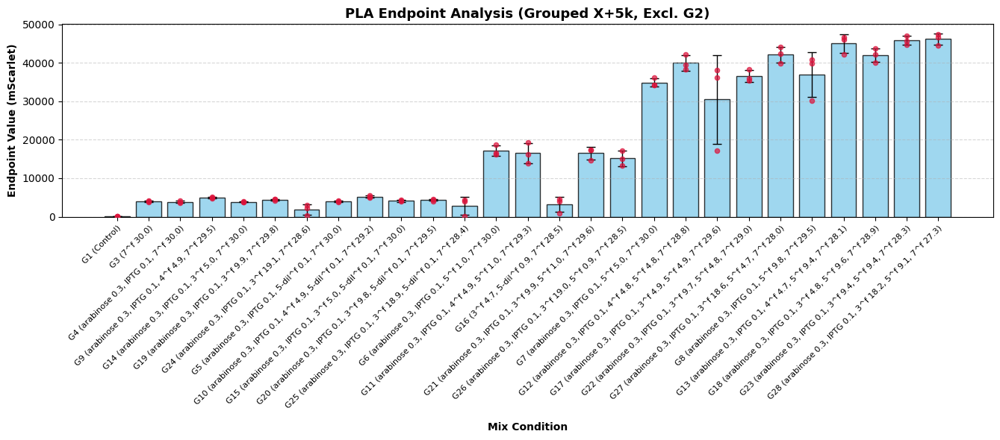

In [22]:
import io
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# 1. Load metadata & data
meta_df = pd.read_csv(io.StringIO(metadata_rows_raw), sep=r'\s+', header=None, names=metadata_headers)
edited_df = pd.read_csv("data_analysis/260818-ds-PLA-edited.csv")

replicates_per_group = 3
num_rows = len(edited_df)
num_groups = int(np.ceil(num_rows / replicates_per_group))

def get_group_title(meta_df, mix_idx):
    row = meta_df.iloc[mix_idx]
    cols = [c for c in meta_df.columns if c not in ['EB', 'CE']]
    parts = []
    for col in cols:
        val = pd.to_numeric(row[col], errors='coerce')
        if pd.notna(val) and val > 0:
            formatted_val = f"{val:.1f}" if val >= 0.1 else f"{val:.2f}"
            parts.append(f"{col} {formatted_val}")
    return ", ".join(parts) if parts else "Control"

# 2. Build custom group ordering
# Start with Group 1 and Group 3 (G2 excluded)
ordered_group_numbers = [1, 3]

# Generate interleaved sequence for X = 4, 5, 6, 7, 8 (X + 5k)
max_group = num_groups
for x in range(4, 9):
    current = x
    while current <= max_group:
        ordered_group_numbers.append(current)
        current += 5

# 3. Extract endpoints and labels in the new order
group_labels = []
means = []
stds = []
filtered_group_indices = []

for g_num in ordered_group_numbers:
    group_idx = g_num - 1  # Convert to 0-based index
    
    start_row = group_idx * replicates_per_group
    end_row = min(start_row + replicates_per_group, num_rows)
    
    group_df = edited_df.iloc[start_row:end_row]
    endpoints = group_df.iloc[:, -1]
    
    means.append(endpoints.mean())
    stds.append(endpoints.std())
    
    condition = get_group_title(meta_df, group_idx)
    group_labels.append(f"G{g_num} ({condition})")
    filtered_group_indices.append(group_idx)

# 4. Create Bar Plot
plt.figure(figsize=(max(12, len(means) * 0.5), 6))

x_pos = np.arange(len(means))
bars = plt.bar(
    x_pos, 
    means, 
    yerr=stds, 
    capsize=4, 
    color='skyblue', 
    edgecolor='black', 
    alpha=0.8,
    error_kw={'ecolor': 'black', 'linewidth': 1}
)

# Overlay triplicate dots
for i, orig_group_idx in enumerate(filtered_group_indices):
    start_row = orig_group_idx * replicates_per_group
    end_row = min(start_row + replicates_per_group, num_rows)
    endpoints = edited_df.iloc[start_row:end_row, -1]
    plt.scatter([i] * len(endpoints), endpoints, color='crimson', zorder=3, alpha=0.7, s=20)

plt.xlabel("Mix Condition", fontweight="bold", labelpad=12)
plt.ylabel("Endpoint Value (mScarlet)", fontweight="bold")
plt.title("PLA Endpoint Analysis (Grouped X+5k, Excl. G2)", fontsize=13, fontweight="bold")

# 5. Tilted X-Labels
plt.xticks(
    x_pos, 
    group_labels, 
    rotation=45,
    ha='right',
    rotation_mode='anchor',
    fontsize=8
)

plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()

plt.savefig("echo-260818/260818-ds-PLA-endpoints.svg", format="svg", bbox_inches="tight")
plt.show()

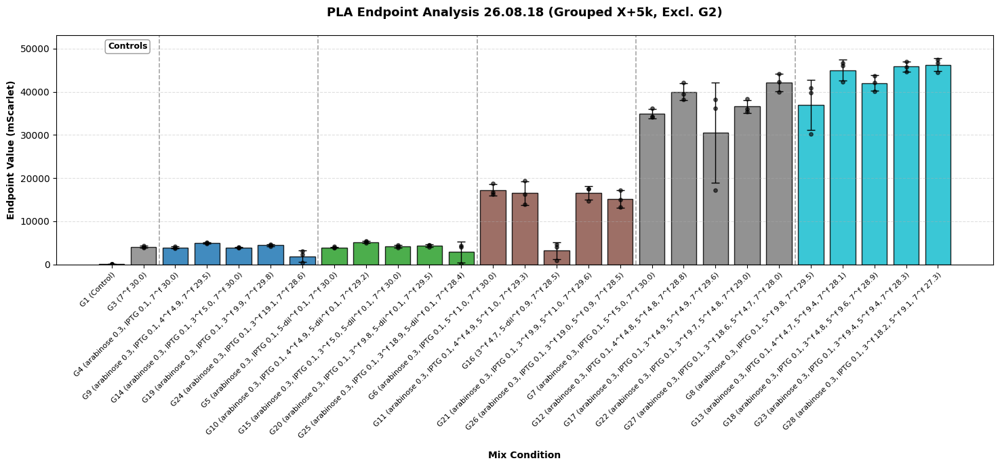

In [27]:
import io
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# 1. Load metadata & data
meta_df = pd.read_csv(io.StringIO(metadata_rows_raw), sep=r'\s+', header=None, names=metadata_headers)
edited_df = pd.read_csv("data_analysis/260818-ds-PLA-edited.csv")

replicates_per_group = 3
num_rows = len(edited_df)
num_groups = int(np.ceil(num_rows / replicates_per_group))

def get_group_title(meta_df, mix_idx):
    row = meta_df.iloc[mix_idx]
    cols = [c for c in meta_df.columns if c not in ['EB', 'CE']]
    parts = []
    for col in cols:
        val = pd.to_numeric(row[col], errors='coerce')
        if pd.notna(val) and val > 0:
            formatted_val = f"{val:.1f}" if val >= 0.1 else f"{val:.2f}"
            parts.append(f"{col} {formatted_val}")
    return ", ".join(parts) if parts else "Control"

# 2. Build custom group ordering & assign colors per series
ordered_group_numbers = [1, 3]
bar_colors = ['#888888', '#888888']  # Controls / standalone get neutral gray
block_boundaries = [1.5]             # X-coordinates for vertical dividing lines
block_labels = [(0.5, "Controls")]   # (x_center_pos, label_text) for top annotations

stride = 5
max_group = num_groups

# Distinct color palette for the 6 series blocks
palette = plt.cm.tab10(np.linspace(0, 1, stride))

current_x_pos = 2
for block_idx, x in enumerate(range(4, 4 + stride)):
    start_pos = current_x_pos
    current = x
    color = palette[block_idx]
    
    while current <= max_group:
        ordered_group_numbers.append(current)
        bar_colors.append(color)
        current += stride
        current_x_pos += 1
        
    end_pos = current_x_pos - 1
    center_pos = (start_pos + end_pos) / 2
    
    block_boundaries.append(end_pos + 0.5)
    

# Drop the last boundary line since it falls past the last bar
block_boundaries.pop()

# 3. Extract endpoints and labels in the new order
group_labels = []
means = []
stds = []
filtered_group_indices = []

for g_num in ordered_group_numbers:
    group_idx = g_num - 1  # 0-based index
    start_row = group_idx * replicates_per_group
    end_row = min(start_row + replicates_per_group, num_rows)
    
    group_df = edited_df.iloc[start_row:end_row]
    endpoints = group_df.iloc[:, -1]
    
    means.append(endpoints.mean())
    stds.append(endpoints.std())
    
    condition = get_group_title(meta_df, group_idx)
    group_labels.append(f"G{g_num} ({condition})")
    filtered_group_indices.append(group_idx)

# 4. Create Bar Plot
plt.figure(figsize=(max(14, len(means) * 0.55), 7))
x_pos = np.arange(len(means))

bars = plt.bar(
    x_pos, 
    means, 
    yerr=stds, 
    capsize=4, 
    color=bar_colors, 
    edgecolor='black', 
    alpha=0.85,
    error_kw={'ecolor': 'black', 'linewidth': 1}
)

# Overlay triplicate dots
for i, orig_group_idx in enumerate(filtered_group_indices):
    start_row = orig_group_idx * replicates_per_group
    end_row = min(start_row + replicates_per_group, num_rows)
    endpoints = edited_df.iloc[start_row:end_row, -1]
    plt.scatter([i] * len(endpoints), endpoints, color='black', zorder=3, alpha=0.6, s=15)

# 5. Add visual differentiators: Vertical boundary lines & top block headers
y_max = max(means) * 1.15 if means else 1.0
plt.ylim(0, y_max)

for boundary in block_boundaries:
    plt.axvline(x=boundary, color='gray', linestyle='--', linewidth=1.2, alpha=0.7)

for center_pos, label_text in block_labels:
    plt.text(
        center_pos, 
        y_max * 0.93, 
        label_text, 
        ha='center', 
        va='bottom', 
        fontsize=9, 
        fontweight='bold', 
        bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='gray', alpha=0.8)
    )

plt.xlabel("Mix Condition", fontweight="bold", labelpad=12)
plt.ylabel("Endpoint Value (mScarlet)", fontweight="bold")
plt.title("PLA Endpoint Analysis 26.08.18 (Grouped X+5k, Excl. G2)", fontsize=13, fontweight="bold", pad=20)

plt.xticks(
    x_pos, 
    group_labels, 
    rotation=45,
    ha='right',
    rotation_mode='anchor',
    fontsize=8
)

plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()

plt.savefig("echo-260818/260818-ds-PLA-endpoints-differentiated.svg", format="svg", bbox_inches="tight")
plt.show()